# Machine Learning Project - The Boolean Pandemic
Pedro Miguel Reis - M20180428 <br>
Bernardo Mendes Ferreira - M20190450 <br>
Group 10

# 0. Imports

In [1]:
import os, sys
from datetime import datetime
import numpy as np, pandas as pd
from sklearn.metrics import make_scorer, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
from sklearn.feature_selection import RFECV
import matplotlib.pyplot as plt
try:
    from tqdm import tqdm
except:
    !{sys.executable} -m pip install tqdm
    from tqdm import tqdm
try:
    import pandas_profiling
except:
    !{sys.executable} -m pip install pandas-profiling
    import pandas_profiling

# 1. Data Preparation & Pre-Processing
Data preparation concerns all data transformation processes applied to the dataset in order to improve the data quality and therefore the value of the information. Good and clean data is crucial to good models. In this step a sample overview was carried out followed by treatment of inconsistent data, zeros and NaN values as well as some imputation to address NaN values.
Pre-processing concerns all data transformations in order to reduce noise’s dataset and the size of the input space as well as normalization processes. In order to accomplish these processes it were carried out processes to remove irrelevant and correlated variables

In [2]:
input_folder = "data"
output_folder = "output"
profiles_folder = "profiles"

for dirname, _, filenames in os.walk(input_folder):
    for filename in filenames:
        print(os.path.join(dirname, filename))

os.makedirs(output_folder, exist_ok=True)
os.makedirs(profiles_folder, exist_ok=True)

train = pd.read_csv(f"{input_folder}/train.csv")
test = pd.read_csv(f"{input_folder}/test.csv")
seed = 2020

data\sampleSubmission.csv
data\test.csv
data\train.csv


#### 1.1. First data profiling 
In order to address feature engineering, NaN values, inconsistent, correlated and irrelevant data, a data profile shall be done. We used `pandas_profiling` in order to achieve that both to train and test data.

In [3]:
trainprofile = train.profile_report(title='Train Profiling Report', plot={'histogram': {'bins': 8}})
trainprofile.to_file(output_file=f"{profiles_folder}/train_profiling.html")
testprofile = test.profile_report(title='Test Profiling Report', plot={'histogram': {'bins': 8}})
testprofile.to_file(output_file=f"{profiles_folder}/test_profiling.html")

In [4]:
trainprofile

In [5]:
testprofile

In [6]:
target = "Deceased"
id_col = "Patient_ID"
test_ids = test[id_col]

#### 1.2. Title
From this variable, we can draw some relevant information that helps in predicting the death of an individual, namely gender, age range and a level of probability of living with more or less people. However, the only information we intend to take from this variable is gender. For the age, we managed to get the right age from the `Birthday_Year` field and the possibility of living with more or less people can be drawn by `Wife/Husband or children infected` and `Parents or siblings infected`
In this way, we were able to code the distinct values of our variable in only two possibilities: `male` or `female`. This will help to keep our inputspace controlled as the number of possibilities will be less when one hot encoding is applied. So we created a new feature called `Gender` and dropped feature `Title`

In [7]:
# Create `Title`
train["Title"] = pd.DataFrame(train["Name"].str.split().tolist(), index=train.index,
                              columns=["Title", "First_name", "Last_name"])["Title"]
test["Title"] = pd.DataFrame(test["Name"].str.split().tolist(), index=test.index,
                             columns=["Title", "First_name", "Last_name"])["Title"]

# Map `Title` to `Gender`
title_map = {"Miss": "Female", "Ms.": "Female", "Mrs.": "Female",
             "Master": "Male", "Mr.": "Male"}
train["Gender"] = train["Title"].map(title_map)
test["Gender"] = test["Title"].map(title_map)

#### 1.3. Medical Tent
When observing the data profile previously made we saw that most of the values of this variable were NaN. We had two possibilities of addressing this situation:<br>
1 - Remove the variable<br>
2 - Consider that the NaN itself was information that reflected a concrete situation that can be quite relevant to the data forecast.<br>
<br>
We followed the former one and considered the variable `In_Tent`, which assumes the value 1 if the individual has been in a tent and the value 0 if he is not. So we created a new feature called `In_Tent` and dropped feature `Medical_Tent`

In [8]:
train["In_Tent"] = (train["Medical_Tent"].notna() * 1).astype(np.int8)
test["In_Tent"] = (test["Medical_Tent"].notna() * 1).astype(np.int8)

#### 1.4. Birthday_Year
In order to make this feature more differentiable we reduced its scale by transforming `Birthday_Year` in `Age`. So we created a new feature called `Age` and dropped `Birthday_Year`

In [9]:
train["Age"] = 2020 - train["Birthday_year"]
test["Age"] = 2020 - test["Birthday_year"]

#### 1.5. Features concerning family 
The two features `Wife/Husband or children infectes` and `Parents or siblings infected` did not consider some combinations of particular cases in which people had elements of the same family contaminated.  Adittionally `Wife/Husband or children infected` and `Parents or siblings infected` are highly correlated. In this way, we create a new variable called `Relatives Infected` and dropped `Wife/Husband or children infected` and `Parents or siblings infected`. <br>
<br>
We created `dfcombined` dataframe (concat between train and test data) in order to get all possible values from categorical columns.
<br><br>
We assumed that it was different to the predicted result if we are considering an individual that have some relatives with high severity values or an individual that have infected relatives with low severity values. So we created a new feature called `Avg_severity_per_family`<br>
<br>
In order to better discriminate individual medical expenses we created a new feature called `Avg_expenses_per_relative` and dropped `Medical_Expenses_Family`

In [10]:
train["is_train"] = 1
test["is_train"] = 0
dfcombined = pd.concat([train, test], axis=0)

counts_Family_ID = dict(dfcombined.groupby("Family_Case_ID").count()["Patient_ID"])
dfcombined["Relatives_Infected"] = dfcombined["Family_Case_ID"].map(counts_Family_ID).astype(np.int8)
dfcombined["Avg_expenses_per_relative"] = dfcombined["Medical_Expenses_Family"] / dfcombined["Relatives_Infected"]

severity_Family_ID = (dfcombined.groupby("Family_Case_ID").mean()["Severity"])
dfcombined["Avg_severity_per_family"] = dfcombined["Family_Case_ID"].map(severity_Family_ID)

#### 1.6. Leading with categorical columns
We addressed categorical columns using one hot encoding. However, before we applied that method we created `dfcombined` dataframe (concat between train and test data) in order to get all possible values from categorical columns. Then, we filled NaNs values using dfcombined mean.

In [11]:
for col in ["City", "In_Tent", "Gender"]: # nominal_categorical columns
    dfcombined = pd.concat([
        dfcombined.drop(col, axis=1),
        pd.get_dummies(dfcombined[col], prefix=col)
    ], axis=1)

train = dfcombined[dfcombined["is_train"]==1].drop("is_train", axis=1).fillna(dfcombined.mean())
test = dfcombined[dfcombined["is_train"]==0].drop([target, "is_train"], axis=1).fillna(dfcombined.mean())

#### 1.7. Drop columns
`Wife/Husband or children infected`, `Parents or siblings infected`, `Title`, `Birthday_year`, `Medical_Expenses_Family`, `Medical_Tent` - The removal of this columns was justified previously. <br> 
<br>
`Name`, `Patient_ID`,`Family_Case_ID` - This features are irrelevant to predict our result. IDs are just auto-increments and we don't need to know the name of an individual in order to predict its death. The only relevant information we can get from that variable was a potential gender associated with and we already had the feature `Gender` to address that situation. 

In [12]:
to_drop = ["Name", "Family_Case_ID", "Wife/Husband or children infected", "Parents or siblings infected",
           "Birthday_year", "Medical_Tent", "Medical_Expenses_Family", "Patient_ID", "Title"]

train.drop(to_drop, axis=1, inplace=True)
test.drop(to_drop, axis=1, inplace=True)

# 2. Training

In [13]:
X, y = train.drop(target, axis=1), train[target].astype(np.int8)
train_cols = X.columns

#### 2.1. Evaluate models
Created `eval_models`, a function that dinamically evaluates any model or bagging ensemble of models and returns the average accuracy and the standard deviation of the accuracy obtained by the train during all the `K` defined stratified folds.

In [14]:
def eval_models(clfs:list, X, y, test_size=0.25, random_state=2020, nfolds=200, **kwargs):
    accs = []
    sss = StratifiedShuffleSplit(n_splits=nfolds, test_size=test_size, random_state=random_state)

    weights = kwargs.get("weights", np.zeros((len(clfs),)) + (1/len(clfs)))
    
    if len(clfs) != len(weights):
        raise Exception(f"len(clfs) should match len(weights), but len(clfs):\
                        {len(clfs)} and len(weights): {len(weights)}")
    
    for train_indices, test_indices in tqdm(sss.split(X, y), total=sss.get_n_splits(), desc="fold"):
        X_train, X_test = X.values[train_indices], X.values[test_indices]
        y_train, y_test = y.values[train_indices], y.values[test_indices]
        
        preds = np.zeros((len(X_test), 2))

        for n, model in enumerate(clfs):
            model.fit(X_train, y_train)
            preds += model.predict_proba(X_test) * weights[n]
        
        predictions = preds.argmax(axis=1)
        accs.append(accuracy_score(y_test, predictions))
        
    mean_outcome = np.mean(accs)
    stdev_outcome = np.std(accs)
    return mean_outcome, stdev_outcome

#### 2.2. Train models

In [15]:
rfc = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced_subsample',
                             criterion='gini', max_depth=11, max_features='auto',
                             max_leaf_nodes=None, max_samples=None,
                             min_impurity_decrease=0.0, min_impurity_split=None,
                             min_samples_leaf=1, min_samples_split=3,
                             min_weight_fraction_leaf=0.0, n_estimators=200,
                             n_jobs=3, oob_score=False, random_state=seed, verbose=0,
                             warm_start=False)

mean_accuracy0, stdev_accuracy0 = eval_models([rfc], X, y, random_state=seed, nfolds=200)

print(f"\t...mean accuracy:  {mean_accuracy0}\n\t...stdev accuracy: {stdev_accuracy0}")
print(sorted(train_cols.tolist()))
rfc.fit(X, y)

fold: 100%|██████████████████████████████████████████████████████████████████████████| 200/200 [01:46<00:00,  1.88it/s]


	...mean accuracy:  0.8287111111111111
	...stdev accuracy: 0.020973069151405323
['Age', 'Avg_expenses_per_relative', 'Avg_severity_per_family', 'City_Albuquerque', 'City_Santa Fe', 'City_Taos', 'Gender_Female', 'Gender_Male', 'In_Tent_0', 'In_Tent_1', 'Relatives_Infected', 'Severity']


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=11, max_features='auto', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=3, min_weight_fraction_leaf=0.0,
                       n_estimators=200, n_jobs=3, oob_score=False,
                       random_state=2020, verbose=0, warm_start=False)

#### 2.3. Grid Search
In order to obtain the best combination of parameters from the `parameters` dictionary, we run sklearn's `GridSearchCV`, using 50 stratified folds.

In [ ]:
# %%time

# nfolds = 50
# sss = StratifiedShuffleSplit(n_splits=nfolds, test_size=0.25, random_state=seed)

# rfc = RandomForestClassifier(n_estimators = 200,
#                              n_jobs = 3,
#                              random_state=seed)

# parameters = {
#     'max_depth': range(3, 15),
#     'min_samples_leaf': range(1, 4),
#     'min_samples_split': range(2, 5),
#     'class_weight': [None, "balanced", "balanced_subsample"]
# }

# grid_obj = GridSearchCV(rfc,
#                         parameters,
#                         scoring=make_scorer(accuracy_score),
#                         cv=sss,
#                         verbose=1,
#                         n_jobs=3,
#                         return_train_score=True)
# grid_obj.fit(X, y)
# rfc = grid_obj.best_estimator_
# rfc_params = grid_obj.best_params_

In [ ]:
# print(rfc_params)

#### 2.4. Feature Selection
As for Feature Selection, we ensure that a Recursive Feature Elimination (`RFE`) decides whether a feature should be kept or not, to improve our accuracy for the Random Forest model.
<br><br>
Besides `RFE`, we also plot the feature importances for the Random Forest model to rest assured that the selection was well made.

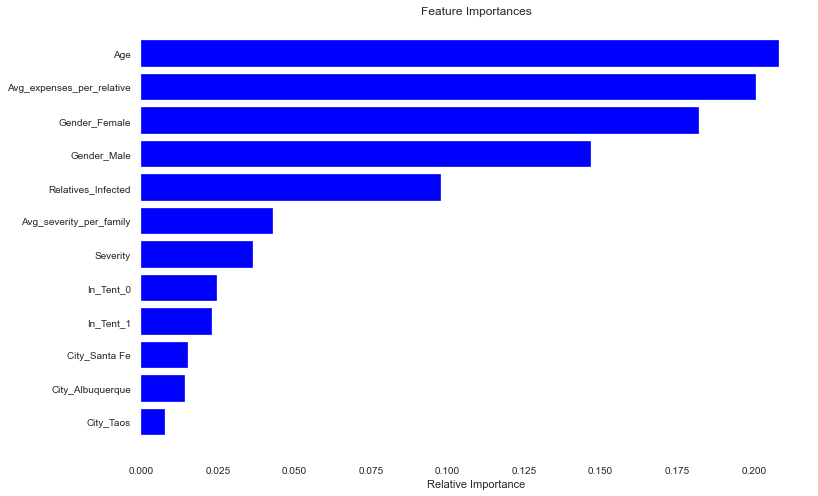

In [16]:
features = X.columns
importances = rfc.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 8))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [17]:
features

Index(['Severity', 'Age', 'Relatives_Infected', 'Avg_expenses_per_relative',
       'Avg_severity_per_family', 'City_Albuquerque', 'City_Santa Fe',
       'City_Taos', 'In_Tent_0', 'In_Tent_1', 'Gender_Female', 'Gender_Male'],
      dtype='object')

In [18]:
best_cols = ['Severity', 'Age', 'Relatives_Infected', 'Avg_expenses_per_relative',
       'Avg_severity_per_family', 'In_Tent_0', 'Gender_Female', 'Gender_Male']

In [24]:
%%time

nfolds = 100
sss = StratifiedShuffleSplit(n_splits=nfolds, test_size=0.25, random_state=2020)

selector = RFECV(rfc, step=1, cv=sss, scoring="accuracy", n_jobs=3, verbose=1)
X = selector.fit_transform(X, y)

bestcols = train.drop([target], axis=1).columns[selector.support_]
print(f"bestcols: {sorted(bestcols.tolist())}")

Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
bestcols: ['Age', 'Avg_expenses_per_relative', 'Avg_severity_per_family', 'Gender_Female', 'Gender_Male', 'Relatives_Infected']
Wall time: 7min 8s


#### 2.5. Bagging Ensemble
In order to induce variance, we combine two different models:

* __Logistic Regression__ - due to its robustness and simplicity;
* __Random Forest__ - previously created

because the combined model is usually better than any of the single base models.
Scikit-learn's MLPClassifier was not used because we had a small dataset.

In [31]:
X = pd.DataFrame(X, index=train.index, columns=bestcols)

In [32]:
lr = LogisticRegression(C=1.0, random_state=seed, n_jobs=-1, max_iter=100)

mean_accuracy2, stdev_accuracy2 = eval_models([rfc, lr], X, y, weights=[0.8, 0.2], random_state=seed, nfolds=200)
print(f"\t...mean accuracy:  {mean_accuracy2}\n\t...stdev accuracy: {stdev_accuracy2}")

fold: 100%|██████████████████████████████████████████████████████████████████████████| 200/200 [01:53<00:00,  1.76it/s]

	...mean accuracy:  0.8367111111111112
	...stdev accuracy: 0.02046009063132359


In [33]:
rfc.fit(X, y)
lr.fit(X, y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=-1, penalty='l2',
                   random_state=2020, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

# 3. Predict

In [35]:
preds = (rfc.predict_proba(test[bestcols]) * 0.8 + lr.predict_proba(test[bestcols]) * 0.2).argmax(axis=1).astype(np.int8)

In [36]:
def find_version():
    """
    Finds automatically the version of the submission. :)
    """
    version = 1
    if len(os.listdir(output_folder)) > 0:
        for file in os.listdir(output_folder):
            if file.split("-")[0].startswith("version"):
                file_version = int(file.split("-")[0].split("n")[1])
                if file_version > version:
                    version = file_version
        return version + 1
    else:
        return version

In [37]:
predictions = pd.DataFrame({id_col: test_ids, target: preds})
version = find_version()
now = datetime.today().strftime("%Y%m%d_%H%M%S")
filename = f"version{version}-{now}-{round(mean_accuracy2, 5)}.csv"
predictions.to_csv(f'{output_folder}/{filename}', index = False)
print(f"Written predictions to 'file {output_folder}/{filename}'...")
predictions.head()

Written predictions to 'file output/version12-20200601_000550-0.83671.csv'...


,Patient_ID,Deceased
0,901,1
1,902,1
2,903,1
3,904,1
4,905,1
